## LTEE-COMETS-Jenga.ipynb by Rohan Maddamsetti

See documentation at: 
https://segrelab.github.io/comets-manual/citrate/  
https://segrelab.github.io/comets-manual/competition_assay/  

In [82]:
import cometspy as c
import matplotlib as plt
import cobra.test
import cobra
import pandas as pd
import numpy as np
from scipy import stats
from os import path
import random

## Functions.

In [83]:
## from: https://docs.python.org/3/library/itertools.html#itertools-recipes
def random_permutation(iterable, r=None):
    "Random selection from itertools.permutations(iterable, r)"
    pool = tuple(iterable)
    r = len(pool) if r is None else r
    return tuple(random.sample(pool, r))

In [84]:
def make_dict_of_KO_strains(anc_model, gene_vec=[]):
    deletion_cobra_models = {}
    
    gene_str_list = [str(gene_obj) for gene_obj in anc_model.genes]
    if len(gene_vec): ## then filter for the genes (strings) in gene_vec.
        gene_str_list = [x for x in gene_str_list if x in gene_vec]
        
    for genestr in gene_str_list:
        cur_KO_model = anc_model.copy()
        cur_KO_model.id = '_'.join([anc_model.id, genestr, "knockout"])
        cur_gene = cur_KO_model.genes.get_by_id(genestr)
        cobra.manipulation.delete_model_genes(cur_KO_model, cur_gene)
        deletion_cobra_models[genestr] = cur_KO_model
    return deletion_cobra_models

In [85]:
def plot_COMETS_DM25_growth(cobra_model, anaerobic=False, maxCycles=24):
    ## Set parameters for the simulation per
    ## https://segrelab.github.io/comets-manual/citrate/
    settings = c.params()
    settings.all_params['timeStep'] = 1.0 ## 1 hour
    settings.all_params['deathRate'] = 0 ## Cit- should not die in DM25-- death also complicates Malthusian fitness
    settings.all_params['batchDilution'] = True
    settings.all_params['dilTime'] = 24
    settings.all_params['dilFactor'] = 100
    settings.all_params['cellSize'] = 3.9e-13 #Size of a single REL606 cell
    settings.all_params['minSpaceBiomass'] = 3.8e-13

    settings.set_param('maxCycles', maxCycles) ## 24 hours by default
    
    flask = c.layout()
    #Set up media to be DM25
    flask.add_typical_trace_metabolites()
    flask.set_specific_metabolite('glc__D_e', 0.000139)
    flask.set_specific_metabolite('cit_e', 0.0017)
    if anaerobic:
        flask.set_specific_metabolite('o2_e', 0.0)
    
    ## Generate comets models and set their initial population size.
    strain = c.model(cobra_model)
    strain.initial_pop = [0, 0, 3.9e-11]
    ## Add the models to the simulation.
    flask.add_model(strain)
    
    ## Run COMETS.
    comp_assay = c.comets(flask, settings)
    comp_assay.run()
    
    biomass = comp_assay.total_biomass
    biomass['t'] = biomass['cycle'] * comp_assay.parameters.all_params['timeStep']

    ## make a plot of the simulated growth curves for debugging.
    myplot = biomass.drop(columns=['cycle']).plot(x = 't')
    myplot.set_ylabel("Biomass (grams)")
    return

In [86]:
def run_COMETS_DM25_fitness_competition(WT_cobra_model, KO_cobra_model, anaerobic=False, maxCycles=24):
    
    ## Set parameters for the simulation per
    ## https://segrelab.github.io/comets-manual/citrate/
    settings = c.params()
    settings.all_params['timeStep'] = 1.0 ## 1 hour
    settings.all_params['deathRate'] = 0 ## Cit- should not die in DM25-- death also complicates Malthusian fitness
    settings.all_params['batchDilution'] = True
    settings.all_params['dilTime'] = 24
    settings.all_params['dilFactor'] = 100
    settings.all_params['cellSize'] = 3.9e-13 #Size of a single REL606 cell
    settings.all_params['minSpaceBiomass'] = 3.8e-13

    settings.set_param('maxCycles', maxCycles) ## 24 hours by default
    
    flask = c.layout()
    #Set up media to be DM25
    flask.add_typical_trace_metabolites()
    flask.set_specific_metabolite('glc__D_e', 0.000139)
    flask.set_specific_metabolite('cit_e', 0.0017)
    if anaerobic:
        flask.set_specific_metabolite('o2_e', 0.0)
    
    ## Generate comets models and set their initial population size.
    anc = c.model(WT_cobra_model)
    anc.initial_pop = [0, 0, 3.9e-11]

    mutpop = c.model(KO_cobra_model)
    mutpop.initial_pop = [0, 0, 3.9e-11]

    ## Add the models to the simulation.
    flask.add_model(anc)
    flask.add_model(mutpop)
    
    ## Run COMETS.
    comp_assay = c.comets(flask, settings)
    comp_assay.run()
    
    biomass = comp_assay.total_biomass
    biomass['t'] = biomass['cycle'] * comp_assay.parameters.all_params['timeStep']

    ## make a plot of the simulated growth curves for debugging.
    myplot = biomass.drop(columns=['cycle']).plot(x = 't')
    myplot.set_ylabel("Biomass (grams)")
    
    ## calculate Malthusian fitness.
    mut_mass24 = biomass.loc[biomass['t'] == 24, KO_cobra_model.id].iloc[0]
    mut_mass0 = biomass.loc[biomass['t'] == 0, KO_cobra_model.id].iloc[0]
    anc_mass24 = biomass.loc[biomass['t'] == 24, WT_cobra_model.id].iloc[0]
    anc_mass0 = biomass.loc[biomass['t'] == 0, WT_cobra_model.id].iloc[0]
    malthusian_fitness = (mut_mass24/mut_mass0)/(anc_mass24/anc_mass0)
    
    return malthusian_fitness

In [87]:
def generate_LTEE_clone_cobra_models(KOed_genes_df, basic_model, using_locus_tag=False):
    
    LTEE_cobra_models = {}
    nonmutator_pops = ["Ara-5", "Ara-6", "Ara+1", "Ara+2", "Ara+4", "Ara+5"]
    mutator_pops = ["Ara-1", "Ara-2", "Ara-3", "Ara-4", "Ara+3", "Ara+6"]
    LTEE_pop_vec = nonmutator_pops + mutator_pops
    model_genes = [x.id for x in basic_model.genes]
    
    for LTEE_pop in LTEE_pop_vec:
        cur_KO_model = basic_model.copy()
        cur_KO_model.id = LTEE_pop + "_50K_A_clone"
        is_cur_pop = (KOed_genes_df["Population"] == LTEE_pop)
        
        if using_locus_tag:
            KOed_genes = [x for x in KOed_genes_df[is_cur_pop].locus_tag]
        else:
            KOed_genes = [x for x in KOed_genes_df[is_cur_pop].blattner]
        
        genes_to_remove = [cur_KO_model.genes.get_by_id(x) for x in KOed_genes if x in model_genes]
        if genes_to_remove:
            cobra.manipulation.delete_model_genes(cur_KO_model, genes_to_remove)
        
        ## Add Cit++ phenotype to Ara-3, if not working with the core model.
        ##if LTEE_pop == "Ara-3" and basic_model.id in "Ecoli-core":
        ##    cur_KO_model.reactions.SUCCt2_2pp.upper_bound = 1000.0
        ##    cur_KO_model.reactions.CITt7pp.upper_bound = 1000.0
        
        LTEE_cobra_models[LTEE_pop] = cur_KO_model
    
    return LTEE_cobra_models

In [88]:
def calc_COMETS_DFE_for_clone(LTEE_models, LTEE_pop, gene_vec=[]):
    cur_clone_model = LTEE_models[LTEE_pop].copy()
    cur_mutants = make_dict_of_KO_strains(cur_clone_model, gene_vec)
    cur_DFE_vec = [run_COMETS_DM25_fitness_competition(cur_clone_model, mut) for (_, mut) in cur_mutants.items()]
    return cur_DFE_vec

## Question: have any of the BiGG core, superessential, or specialist/generalist enzymes been knocked out in the 50K LTEE A clones?

In [89]:
KOed_50K_metabolic_genes = pd.read_csv("../results/metabolic-enzymes/KOed-metabolic-enzymes-in-LTEE-50K-A-clones.csv")

KOed_BiGG_core = KOed_50K_metabolic_genes[KOed_50K_metabolic_genes['MetabolicClass'] == "BiGG_core"]
KOed_superessential = KOed_50K_metabolic_genes[KOed_50K_metabolic_genes['MetabolicClass'] == "Superessential"]
KOed_specialist = KOed_50K_metabolic_genes[KOed_50K_metabolic_genes['MetabolicClass'] == "Specialist"]
KOed_generalist = KOed_50K_metabolic_genes[KOed_50K_metabolic_genes['MetabolicClass'] == "Generalist"]

In [90]:
KOed_BiGG_core

,Population,Gene,locus_tag,blattner,gene_length,product,start,end,strand,MetabolicClass
0,Ara-1,appB,ECB_00982,b0979,1137,cytochrome bd-II oxidase subunit II,1056387,1057523,1,BiGG_core
1,Ara-1,pykF,ECB_01645,b1676,1413,pyruvate kinase,1732965,1734377,1,BiGG_core
2,Ara-1,gltB,ECB_03077,b3212,4554,glutamate synthase large subunit,3289867,3294420,1,BiGG_core
3,Ara-1,pflC,ECB_03837,b3952,879,pyruvate formate lyase II activase,4126365,4127243,1,BiGG_core
4,Ara-2,pfkB,ECB_01692,b1723,930,6-phosphofructokinase II,1783635,1784564,1,BiGG_core
5,Ara-2,fbaB,ECB_02025,b2097,1053,fructose-bisphosphate aldolase,2131641,2132693,-1,BiGG_core
6,Ara-2,dld,ECB_02063,b2133,1716,D-lactate dehydrogenase FAD-binding NADH indep...,2173423,2175138,1,BiGG_core
7,Ara-2,eutI,ECB_02349,b2458,1017,predicted phosphotransacetylase subunit,2493318,2494334,-1,BiGG_core
8,Ara-3,kgtP,ECB_02481,b2587,1299,alpha-ketoglutarate transporter,2645941,2647239,-1,BiGG_core
9,Ara-3,tdcE,ECB_02981,b3114,2295,pyruvate formate-lyase 4/2-ketobutyrate format...,3193158,3195452,-1,BiGG_core


In [91]:
KOed_superessential

,Population,Gene,locus_tag,blattner,gene_length,product,start,end,strand,MetabolicClass
41,Ara-1,pgpB,ECB_01255,b1278,765,phosphatidylglycerophosphatase B,1337702,1338466,1,Superessential
42,Ara-2,mrcB,ECB_00148,b0149,2526,penicillin-binding protein 1b,167581,170106,1,Superessential
43,Ara-2,thiD,ECB_02031,b2103,801,phosphomethylpyrimidine kinase,2137845,2138645,-1,Superessential
44,Ara-4,thiD,ECB_02031,b2103,801,phosphomethylpyrimidine kinase,2137845,2138645,-1,Superessential
45,Ara-5,ispF,ECB_02596,b2746,480,2-C-methyl-D-erythritol 24-cyclodiphosphate sy...,2766162,2766641,-1,Superessential
46,Ara-5,ispD,ECB_02597,b2747,711,2-C-methyl-D-erythritol 4-phosphate cytidylylt...,2766641,2767351,-1,Superessential
47,Ara+1,mrdA,ECB_00604,b0635,1902,transpeptidase involved in peptidoglycan synth...,648900,650801,-1,Superessential
48,Ara+1,ispF,ECB_02596,b2746,480,2-C-methyl-D-erythritol 24-cyclodiphosphate sy...,2766162,2766641,-1,Superessential
49,Ara+1,ispD,ECB_02597,b2747,711,2-C-methyl-D-erythritol 4-phosphate cytidylylt...,2766641,2767351,-1,Superessential
50,Ara+3,thiG,ECB_03867,b3991,771,thiazole synthase,4171476,4172246,-1,Superessential


## Basic metabolic models to play with. Default objective is to maximize biomass.

In [92]:
## pick a baseline metagen
BiGG_model_dir = "../data/BiGG-models"

# the E. coli K-12 iJO1366 model: this is the best curated complete E. coli model.
K12_model = cobra.io.load_json_model(path.join(BiGG_model_dir, "iJO1366.json"))
K12_model.id = "K12"
# Set exchange reaction lower bounds to -1000 to allow them being controlled by COMETS 
for i in K12_model.reactions:
    if 'EX_' in i.id:
        i.lower_bound = -1000.0
## knockout dctA, dcuAB and citT reactions to model the Cit- phenotype in REL606.
K12_model.reactions.SUCCt2_3pp.upper_bound = 0.0 ## dcuAB. should be absent even in Ara-3.
K12_model.reactions.SUCCt2_2pp.upper_bound = 0.0 ##dctA
K12_model.reactions.CITt7pp.upper_bound = 0.0 ## citT

## what if we try to maximize glucose import via PTS rather than biomass (yield?)
max_biomass_K12_model = K12_model.copy()
max_biomass_K12_model.id = "K12-max-biomass"
## or maximize ATP?
max_ATP_K12_model = K12_model.copy()
max_ATP_K12_model.id = "K12-max-ATP"
max_ATP_K12_model.objective = "ATPM"
## maximize glucose import?
max_PTS_K12_model = K12_model.copy()
max_PTS_K12_model.id = "K12-max-PTS"
max_PTS_K12_model.objective = "GLCptspp"

# the E. coli REL606 iECB_1328 model: most relevant to LTEE, but has stochiometric inconsistencies
## in hydrogen/proton conservation.
REL606_model = cobra.io.load_json_model(path.join(BiGG_model_dir, "iECB_1328.json"))
REL606_model.id = "REL606"
# Set exchange reaction lower bounds to -1000 to allow them being controlled by COMETS 
for i in REL606_model.reactions:
    if 'EX_' in i.id:
        i.lower_bound = -1000.0
## knockout dctA, dcuAB and citT reactions to model the Cit- phenotype in REL606.
REL606_model.reactions.SUCCt2_3pp.upper_bound = 0.0
REL606_model.reactions.SUCCt2_2pp.upper_bound = 0.0
REL606_model.reactions.CITt7pp.upper_bound = 0.0

## what if we try to maximize glucose import via PTS rather than biomass (yield?)
max_biomass_REL606_model = REL606_model.copy()
max_biomass_REL606_model.id = "REL606-max-biomass"
## or maximize ATP?
max_ATP_REL606_model = REL606_model.copy()
max_ATP_REL606_model.id = "REL606-max-ATP"
max_ATP_REL606_model.objective = "ATPM"
## maximize glucose import?
max_PTS_REL606_model = REL606_model.copy()
max_PTS_REL606_model.id = "REL606-max-PTS"
max_PTS_REL606_model.objective = "GLCptspp"


## The simplest well-curated model: E. coli core metabolism.
core_model = cobra.io.load_json_model(path.join(BiGG_model_dir, "e_coli_core.json"))
core_model.id = "Ecoli-core"
# Set exchange reaction lower bounds to -1000 to allow them being controlled by COMETS 
for i in core_model.reactions:
    if 'EX_' in i.id:
        i.lower_bound = -1000.0
## no need to knockout dctA, dcuAB and citT reactions for the E. coli core model.

## what if we try to maximize glucose import via PTS rather than biomass (yield?)
max_biomass_core_model = core_model.copy()
max_biomass_core_model.id = "core-max-biomass"
## or maximize ATP?
max_ATP_core_model = core_model.copy()
max_ATP_core_model.id = "core-max-ATP"
max_ATP_core_model.objective = "ATPM"
## maximize glucose import?
max_PTS_core_model = core_model.copy()
max_PTS_core_model.id = "REL606-max-PTS"
max_PTS_core_model.objective = "GLCpts"

## This is cool! A pykF mutant increases glucose import! It seems that this could be a good proxy for selection on growth rather than yield (increase glucose uptake).

In [12]:
pykF_mutant = core_model.copy()
pykF_mutant.id = "pykF_knockout"
pykF_mutant.reactions.PYK.knock_out()

In [13]:
pykF_mutant2 = max_ATP_core_model.copy()
pykF_mutant2.id = "pykF_knockout2"
pykF_mutant2.reactions.PYK.knock_out()

building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!


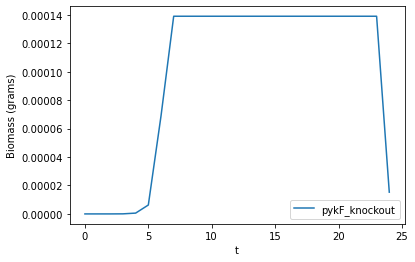

In [14]:
plot_COMETS_DM25_growth(pykF_mutant)

building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!


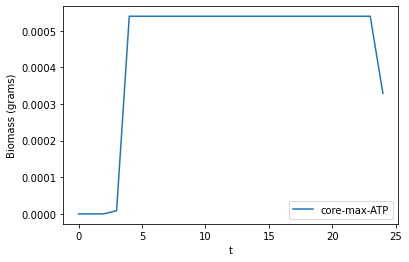

In [15]:
plot_COMETS_DM25_growth(max_ATP_core_model)

building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!


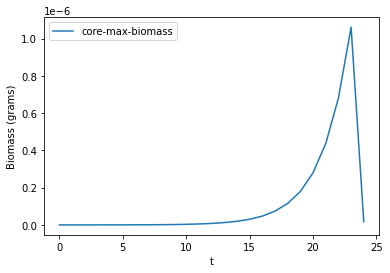

In [16]:
plot_COMETS_DM25_growth(max_biomass_core_model)

building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!


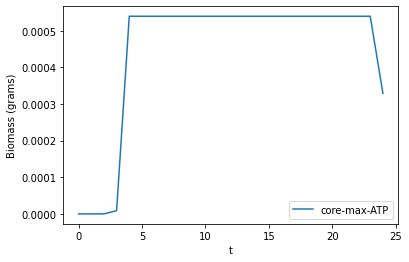

In [17]:
plot_COMETS_DM25_growth(max_ATP_core_model)

building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!


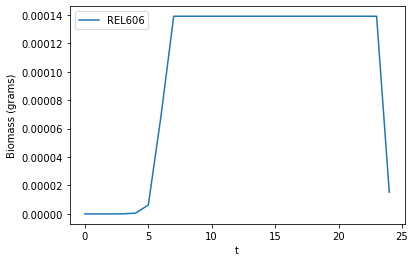

In [18]:
plot_COMETS_DM25_growth(REL606_model)

building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!


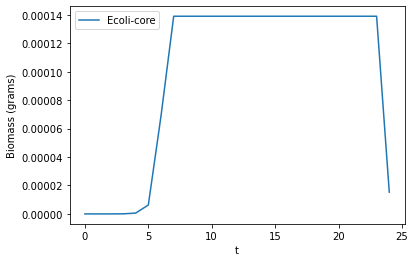

In [27]:
plot_COMETS_DM25_growth(core_model)

building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!


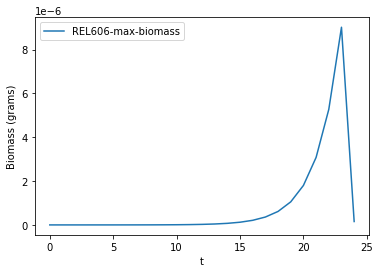

In [20]:
plot_COMETS_DM25_growth(max_biomass_REL606_model)

building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!


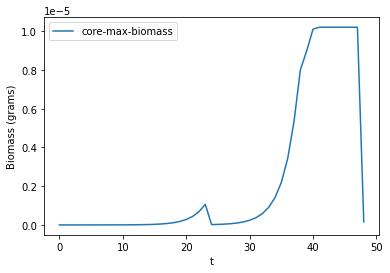

In [21]:
plot_COMETS_DM25_growth(max_biomass_core_model, maxCycles=48)

building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!


931574.6138696574

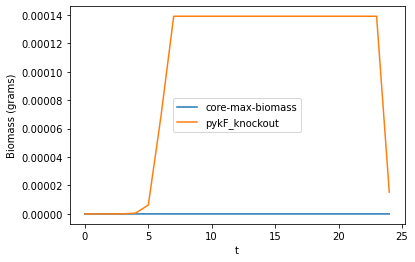

In [22]:
run_COMETS_DM25_fitness_competition(max_biomass_core_model, pykF_mutant, anaerobic=False)

building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!


14.148925015264503

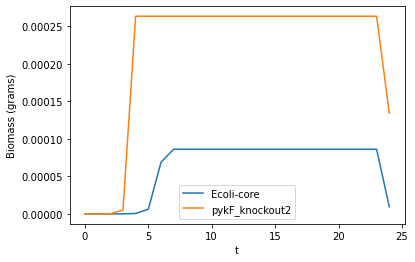

In [23]:
run_COMETS_DM25_fitness_competition(core_model, pykF_mutant2, anaerobic=False)

building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!


1.0088816646441208

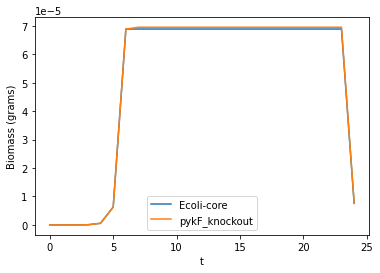

In [24]:
run_COMETS_DM25_fitness_competition(core_model, pykF_mutant, anaerobic=False)

## Question 1: Measure fitness of 50K A clones using just the E. coli core model.

building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added

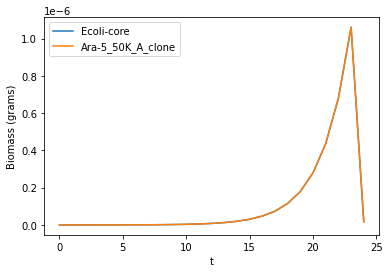

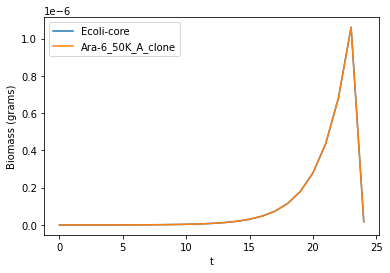

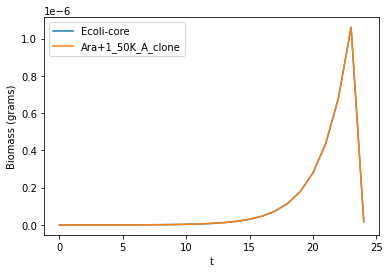

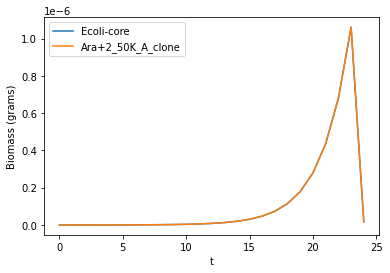

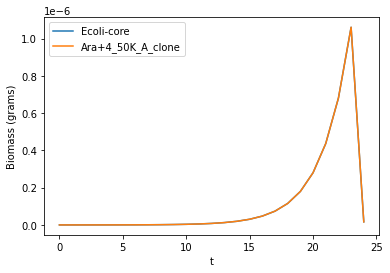

...

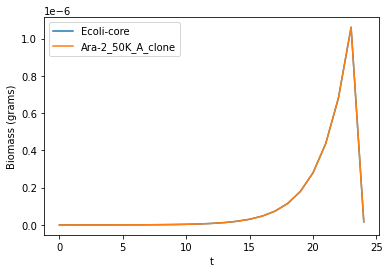

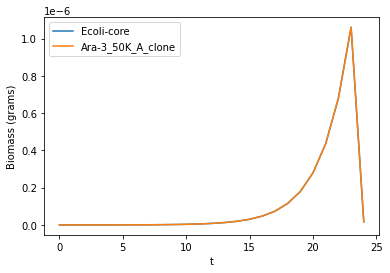

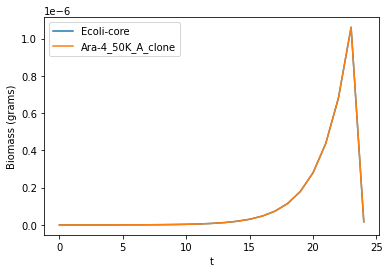

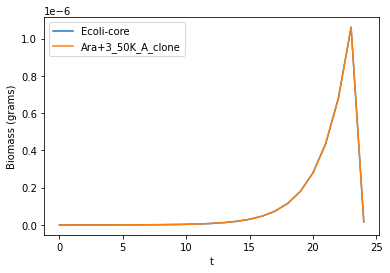

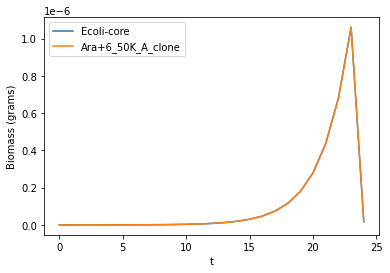

In [112]:
core_LTEE_models = generate_LTEE_clone_cobra_models(KOed_BiGG_core, core_model)
LTEE_50K_clone_core_vec = [run_COMETS_DM25_fitness_competition(core_model, mut) for (_, mut) in core_LTEE_models.items()]

In [113]:
LTEE_50K_clone_core_vec

[0.9945357194955015,
 0.9930149210158322,
 1.0000363055693242,
 1.009893343163214,
 0.992862110660677,
 0.9952632738988105,
 0.997384224295885,
 0.996957254969825,
 1.0140980573127316,
 0.9935659760250901,
 1.014933154559609,
 1.00607452403685]

### Measure the single-KO DFE for each 50K A clone, just using the core metabolic model.

In [35]:
nonmutator_pops = ["Ara-5", "Ara-6", "Ara+1", "Ara+2", "Ara+4", "Ara+5"]
mutator_pops = ["Ara-1", "Ara-2", "Ara-3", "Ara-4", "Ara+3", "Ara+6"]
LTEE_pop_vec = nonmutator_pops + mutator_pops

In [ ]:
##clone_DFE_dict = {LTEE_pop : calc_DFE_for_clone(core_LTEE_models, LTEE_pop) for LTEE_pop in LTEE_pop_vec}
##clone_DFE_df = pd.DataFrame(clone_DFE_dict)
##clone_DFE_df

In [ ]:
##clone_DFE_df.plot(kind="hist", subplots=True, figsize=(8,11), bins=200)

## Question 2: Measure fitness of 50K A clones using the whole genome metabolic model.

In [28]:
all_KOed_genes_in_50K_A_clones = pd.read_csv("../results/metabolic-enzymes/KOed-genes-in-LTEE-50K-A-clones.csv")
all_KOed_genes_in_50K_A_clones

,Population,Gene,locus_tag,blattner,gene_length,product,start,end,strand
0,Ara-1,mutT,ECB_00100,b0099,390,nucleoside triphosphate pyrophosphohydrolase m...,113848,114237,1
1,Ara-1,ybaL,ECB_00429,b0478,1677,predicted transporter with NADP-binding Rossma...,473629,475305,-1
2,Ara-1,ybcR,ECB_00506,b0554,216,predicted phage lysis protein,548867,549082,1
3,Ara-1,ybcS,ECB_00507,b0555,498,predicted lysozyme,549082,549579,1
4,Ara-1,ybcT,ECB_00508,b0556,462,predicted murein endopeptidase,549576,550037,1
...,...,...,...,...,...,...,...,...,...
2290,Ara+6,rbsR,ECB_03639,b3753,993,DNA-binding transcriptional repressor of ribos...,3900034,3901026,1
2291,Ara+6,frvR,ECB_03782,b3897,1749,predicted regulator,4066254,4068002,-1
2292,Ara+6,metH,ECB_03891,b4019,3684,B12-dependent methionine synthase,4202759,4206442,1
2293,Ara+6,sgcQ,ECB_04168,b4303,807,predicted nucleoside triphosphatase,4508249,4509055,-1


In [111]:
all_KOed_genes_in_50K_A_clones[all_KOed_genes_in_50K_A_clones.Population == "Ara+1"]

,Population,Gene,locus_tag,blattner,gene_length,product,start,end,strand
1194,Ara+1,nhaA,ECB_00018,b0019,1167,pH-dependent sodium/proton antiporter,17488,18654,1
1195,Ara+1,dgt,ECB_00159,b0160,1518,deoxyguanosinetriphosphate triphosphohydrolase,182079,183596,1
1196,Ara+1,lacZ,ECB_00298,b0344,3075,beta-D-galactosidase,335787,338861,-1
1197,Ara+1,ybbO,ECB_00444,b0493,810,short chain dehydrogenase,490508,491317,-1
1198,Ara+1,tesA,ECB_00445,b0494,627,multifunctional acyl-CoA thioesterase I and pr...,491307,491933,-1
...,...,...,...,...,...,...,...,...,...
1517,Ara+1,yjcO,ECB_03950,b4078,690,hypothetical protein,4275258,4275947,-1
1518,Ara+1,rpiR,ECB_03961,b4089,891,DNA-binding transcriptional repressor,4290923,4291813,-1
1519,Ara+1,cycA,ECB_04080,b4208,1413,D-alanine/D-serine/glycine transporter,4414863,4416275,1
1520,Ara+1,hsdS,ECB_04214,b4348,1425,specificity determinant for hsdM and hsdR,4558013,4559437,-1


In [49]:
## Generate models from K-12.
iJO1366_LTEE_models = generate_LTEE_clone_cobra_models(all_KOed_genes_in_50K_A_clones, K12_model)

In [130]:
## Let's examine viability based on the criteria in Pal et al. (2006) in Nature
## and Hosseini et al. (2018) in PNAS.

## two genomes are predicted to be inviable: Ara+1 and Ara-3 using K-12 backbone.

test_model = iECB_1328_LTEE_models["Ara+2"]
test_model.optimize()
results = cobra.flux_analysis.single_gene_deletion(test_model)
results[results.growth>1]
#m3_model = iECB_1328_LTEE_models["Ara-3"]
#m3_model.reactions.SUCCt2_2pp.upper_bound = 1000.0 ##dctA
#m3_model.reactions.CITt7pp.upper_bound = 1000.0 ## citT
#m3_model.optimize()

##deletion_results = single_gene_deletion(cobra_model)

,ids,growth,status
0,{ECB_01837},105.660448,optimal
1,{ECB_01450},105.660448,optimal
2,{ECB_03847},105.660448,optimal
3,{ECB_03622},88.041123,optimal
5,{ECB_01922},105.660448,optimal
...,...,...,...
1324,{ECB_02431},105.660448,optimal
1325,{ECB_03454},105.660448,optimal
1326,{ECB_00306},105.660448,optimal
1327,{ECB_00151},105.660448,optimal


building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added

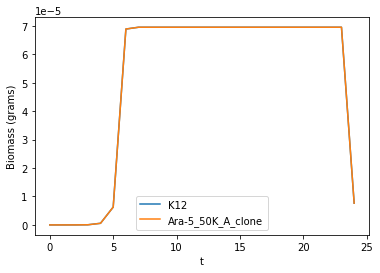

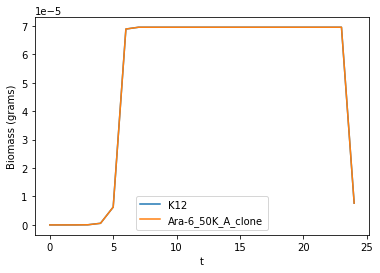

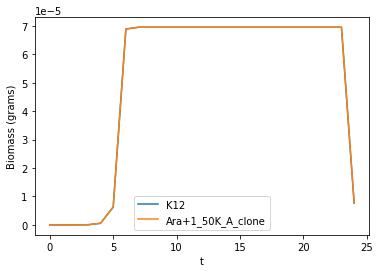

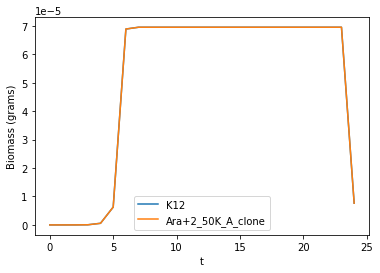

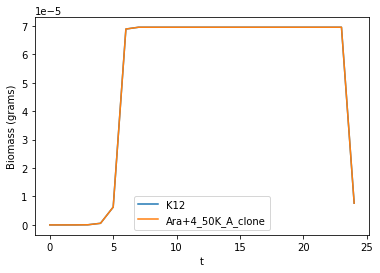

...

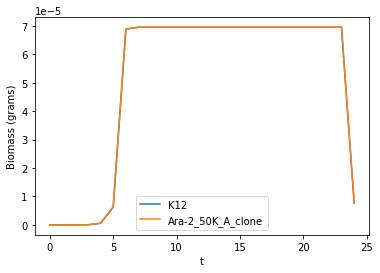

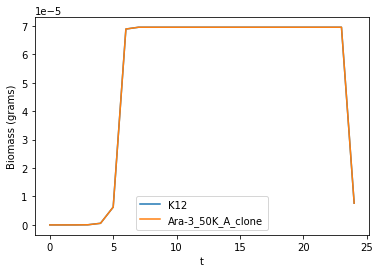

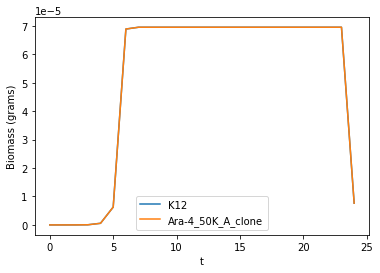

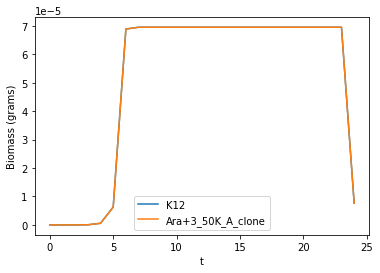

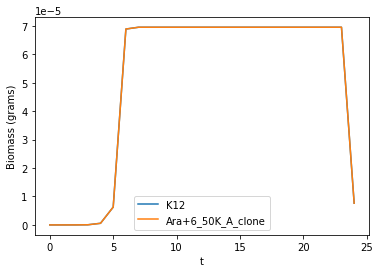

In [29]:
## measure fitness using COMETS.
LTEE_50K_clone_iJO1366_vec = [run_COMETS_DM25_fitness_competition(K12_model, mut) for (_, mut) in iJO1366_LTEE_models.items()]

In [30]:
LTEE_50K_clone_iJO1366_vec

[1.0022876638994611,
 1.0012282187531096,
 0.9993159893691207,
 1.0004411920776008,
 1.000115062077433,
 1.0004431602158312,
 1.0000577726341497,
 0.999053909763089,
 1.0006349562801542,
 1.0015544588453371,
 1.0011132062864858,
 1.0001409772661745]

building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added

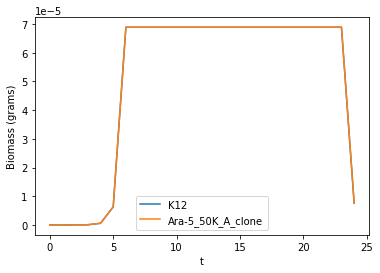

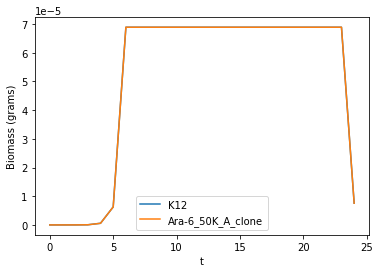

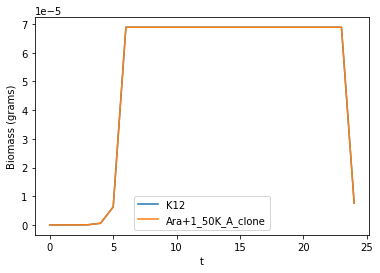

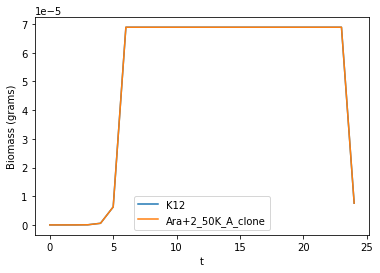

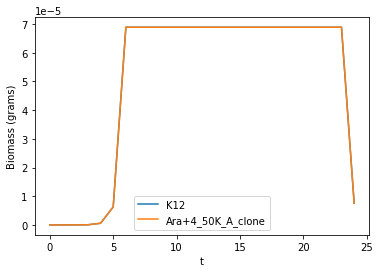

...

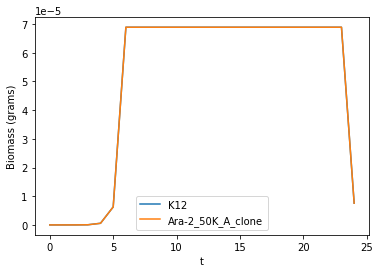

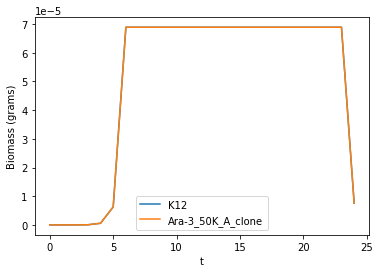

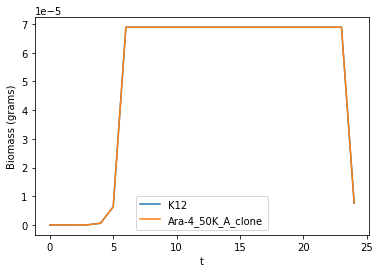

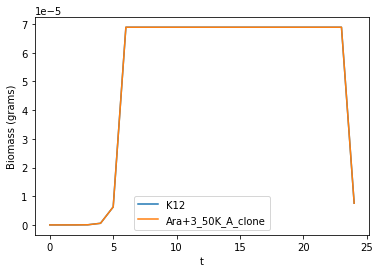

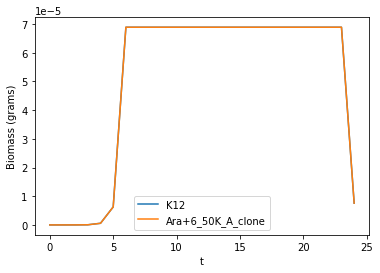

In [31]:
## let's examine anaerobic fitness.
no_O2_LTEE_50K_clone_iJO1366_vec = [run_COMETS_DM25_fitness_competition(K12_model, mut, anaerobic=True) for (_, mut) in iJO1366_LTEE_models.items()]

In [32]:
no_O2_LTEE_50K_clone_iJO1366_vec

[1.000866589410124,
 0.9981896299088516,
 0.9989523755146151,
 1.001808857278135,
 0.9989447611046074,
 0.9996272696072483,
 1.0009409332081938,
 1.0002451754749795,
 1.0017769645978012,
 1.001264905993797,
 0.9984271749678298,
 1.001845118727996]

In [94]:
iECB_1328_LTEE_models = generate_LTEE_clone_cobra_models(all_KOed_genes_in_50K_A_clones, REL606_model, using_locus_tag=True)

In [ ]:
##LTEE_50K_clone_iECB_1328_vec = [run_COMETS_DM25_fitness_competition(REL606_model, mut) for (_, mut) in iECB_1328_LTEE_models.items()]

In [34]:
LTEE_50K_clone_iECB_1328_vec

[0.9999770028028453,
 1.0014951315642397,
 1.0004118780123055,
 1.0017112335439315,
 0.9996232997313478,
 1.0020339040225388,
 0.9999854174814718,
 1.001260333106385,
 0.9989396503442521,
 0.9999551129724725,
 1.001272713379884,
 1.0005049734224347]

## Question 3: Examine knockouts of BiGG core genes and superessential genes in the 50K genomes.
## Is there variation in the DFE across LTEE populations?

In [ ]:
##BiGG_core_genes = pd.read_csv("")
##bigg_core_gene_vec = 

In [ ]:
##iJO1366_LTEE_core_DFE_dict = {LTEE_pop : calc_DFE_for_clone(iJO1366_LTEE_models, LTEE_pop, bigg_core_gene_vec) for LTEE_pop in LTEE_pop_vec}
##iJO1366_LTEE_core_DFE_df = pd.DataFrame(clone_DFE_dict)
##iJO1366_LTEE_core_DFE_df

In [39]:
superessential_genes_df = pd.read_csv("../results/metabolic-enzymes/Barve2012-S6-superessential.csv")
superessential_gene_vec = [x for x in superessential_genes_df.blattner]

building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added

/Users/Rohandinho/anaconda3/envs/mamba/lib/python3.7/site-packages/pandas/plotting/_matplotlib/core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)



Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layo


Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layo


Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layo


Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layo


Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layo


Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layo


Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layo


Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layo


Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layo


Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layo


Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layo


Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layo


Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layo


Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layo


Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layo


Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layo


Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layo


Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layo


Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layo


Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layo


Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layo


Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layo


Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layo


Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layo


Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layo


Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layo


Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layo


Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layo


Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layo


Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layo


Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layo


Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layo


Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layo


Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layo


Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layo


Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layo


Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layo


Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layo


Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layo


Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layo


Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layo


Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layo


Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layo


Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!
building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!


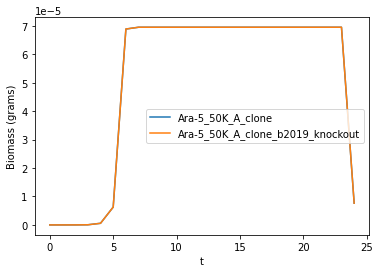

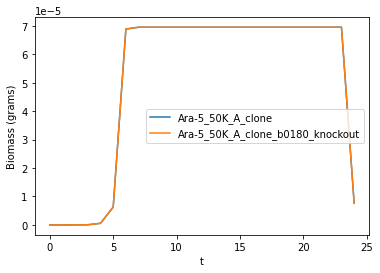

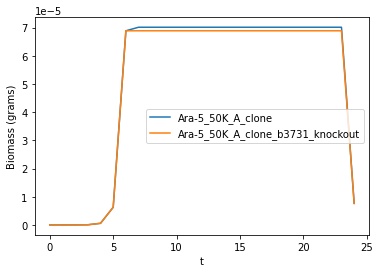

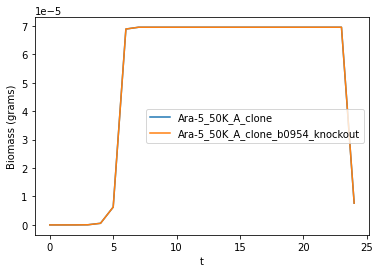

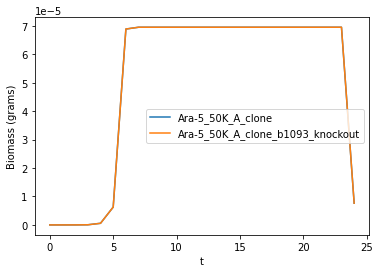

...

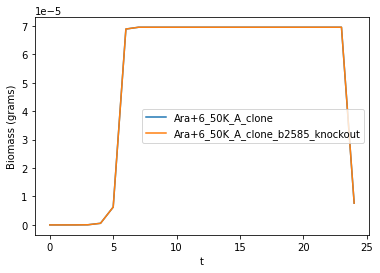

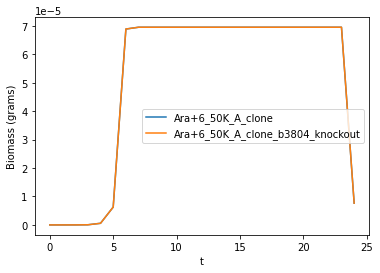

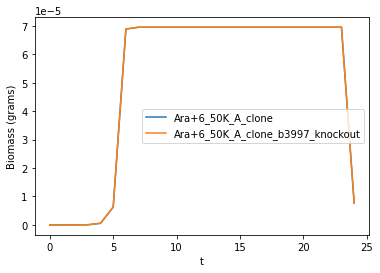

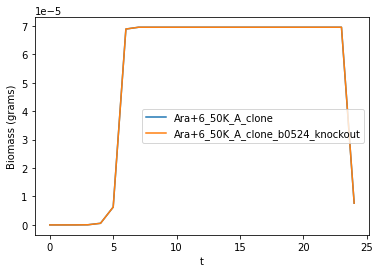

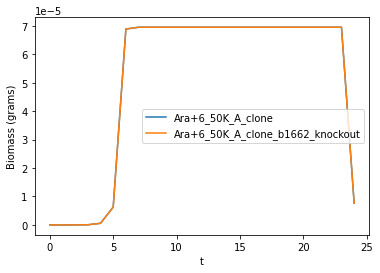

In [42]:
iJO1366_LTEE_superessential_DFE_dict = {LTEE_pop : calc_DFE_for_clone(iJO1366_LTEE_models, LTEE_pop, superessential_gene_vec) for LTEE_pop in LTEE_pop_vec}

In [43]:
iJO1366_LTEE_superessential_DFE_df = pd.DataFrame(iJO1366_LTEE_superessential_DFE_dict)
iJO1366_LTEE_superessential_DFE_df

,Ara-5,Ara-6,Ara+1,Ara+2,Ara+4,Ara+5,Ara-1,Ara-2,Ara-3,Ara-4,Ara+3,Ara+6
0,0.999358,0.998421,1.000543,1.000247,0.999793,0.999839,0.999948,1.000594,0.998721,1.000778,0.999091,1.000232
1,0.998521,1.000004,1.000283,1.000854,1.000648,1.000928,1.000508,0.999375,0.999424,0.998887,1.000244,1.001138
2,0.984967,0.982294,0.982448,0.981841,0.981900,0.982365,0.981588,0.983239,0.983740,0.982776,0.981684,0.982175
3,1.000179,0.999545,0.999205,0.999535,1.000808,0.999121,1.000791,1.000113,1.000773,1.000333,0.999234,0.998527
4,1.001385,0.998553,1.000019,0.999982,1.001759,0.999085,1.001773,1.001339,0.998332,1.000192,1.000205,1.000022
...,...,...,...,...,...,...,...,...,...,...,...,...
94,1.001307,0.999344,0.999877,1.001097,1.001364,1.000149,1.000866,1.000390,0.997869,1.000711,0.999294,0.999830
95,0.998935,1.002214,1.000256,1.001473,0.999798,1.000444,1.000677,1.001764,0.999741,1.000285,0.999172,1.000448
96,0.998098,1.000197,0.997321,0.998853,0.999383,1.000763,0.998742,0.999604,1.000775,0.999473,0.999250,1.000628
97,0.999456,0.999201,1.001420,0.999309,0.999085,0.998445,0.999869,1.001814,0.999840,1.000195,1.000289,1.000232


array([[<AxesSubplot:title={'center':'Ara+1'}>,
        <AxesSubplot:title={'center':'Ara+2'}>,
        <AxesSubplot:title={'center':'Ara+3'}>],
       [<AxesSubplot:title={'center':'Ara+4'}>,
        <AxesSubplot:title={'center':'Ara+5'}>,
        <AxesSubplot:title={'center':'Ara+6'}>],
       [<AxesSubplot:title={'center':'Ara-1'}>,
        <AxesSubplot:title={'center':'Ara-2'}>,
        <AxesSubplot:title={'center':'Ara-3'}>],
       [<AxesSubplot:title={'center':'Ara-4'}>,
        <AxesSubplot:title={'center':'Ara-5'}>,
        <AxesSubplot:title={'center':'Ara-6'}>]], dtype=object)

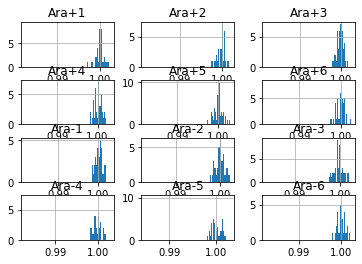

In [46]:
iJO1366_LTEE_superessential_DFE_df.hist(bins=200)

## Question 4: Take random adaptive walks from the core metabolic model. Two questions: 1) How much variation in how long to reach a local maximum? 2) Are the evolved networks more fragile?

In [ ]:
def play_jenga_version1(basic_model):
    """
    While there exist genes that have a beneficial effect when knocked out:
    - randomly order the genes to remove.
    - generate a KO. If deleterious, then reject the change and continue.
      If the change is beneficial, then accept and update the model.
    - once the entire DFE of possible KOs is deleterious,
    return the evolved model.
    """
    evolved_model = basic_model.copy()
    evolved_model.id = "jenga_evolved"
    
    steps = 0 ## number of genes KO'ed so far
    while(True):
        evolved_model_genes = [x.id for x in evolved_model.genes]
        gene_strs_to_sample = random_permutation([str(gene_obj) for gene_obj in evolved_model_genes])
        
        cur_KO_model = evolved_model.copy()
        cur_KO_model.id = evolved_model.id + "_step" + str(steps)
        
        found_beneficial_mutant = False
        for genestr in gene_strs_to_sample:    
            cur_gene = cur_KO_model.genes.get_by_id(genestr)
            cobra.manipulation.delete_model_genes(cur_KO_model, [cur_gene])
            mutant_fitness = run_COMETS_DM25_fitness_competition(evolved_model, cur_KO_model)
            if mutant_fitness > 1:
                found_beneficial_mutant = True;
                evolved_model = cur_KO_model
                evolved_model.id = "jenga_evolved"
                steps += 1
                print("steps <= " + str(steps))
                break ## we found a beneficial mutant, so leave the for loop.
            else: ## backtrack the mutation.
                cur_KO_model = evolved_model.copy()
                cur_KO_model.id = evolved_model.id + "_step" + str(steps)
                
        if not found_beneficial_mutant:
            break ## leave the while loop.    
    return evolved_model

In [ ]:
jenga_mode1_1 = play_jenga_version1(core_model)